# Project 2 Report

## Introduction

The Department for Transport (DfT) monitors road traffic on the British road network by periodically sending people to count the number of vehicles travelling on a given road per hour. These counts are performed each year, over a 12-hour period, on a weekday between March and October and some roads are counted every year, some less often. The DfT releases this data to the public every year, under an Open Government License. At this time, data is available for the counts made in years 2000 until 2019. The aim of this project is to analyse this data for roads in Scotland to gain some insights about traffic over the past 20 years. We first begin by looking at the roads, particulary the busyness, who manages them and the position of the counters. Following this, we investigate some traffic patterns over time. Finally, we do some geographic analysis of the data, where we focus on specific areas of Scotland.

**Install commands for required packages:**
- conda install --channel conda-forge geopandas 
- pip install folium
- pip install descartes
- pip install plotly
- pip install shapely
- pip install pyproj
 
<br/>
Note: geopandas may require an update if already installed.

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns; sns.set()
import matplotlib.pyplot as plt
import geopandas as gpd
import folium
import plotly.express as px
from folium.plugins import MarkerCluster

In [2]:
data = pd.read_csv("dft_rawcount_region_id_3.csv", dtype = {"start_junction_road_name": "string", "end_junction_road_name": "string"})

## Data Summary

The dataset has 279,480 rows and 32 columns corresponding to 11,394 counts at 3,246 different count points from 2000 to 2019. Over 100 billion motor vehicles in total were manually counted over the 20 years. The data includes information about each count such as details of the location, as well as the results of the counts, broken down by vehicle type for each hour.

In [3]:
print("Number of counts: ",len(data[["count_point_id","count_date"]].drop_duplicates()))
print("Number of count points: ", len(data[["count_point_id"]].drop_duplicates()))
print("Number of motor vehicles counted: ", data[["all_motor_vehicles"]].sum().to_list()[0])

Number of counts:  11394
Number of count points:  3246
Number of motor vehicles counted:  102632116


## Roads

### Roads by Local Authority

This section looks at the local authorities within the dataset.  Specifically looking at the number of roads that each authority manages, and whether this has changed from the first year of the data (2000) to the latest full year (2019).

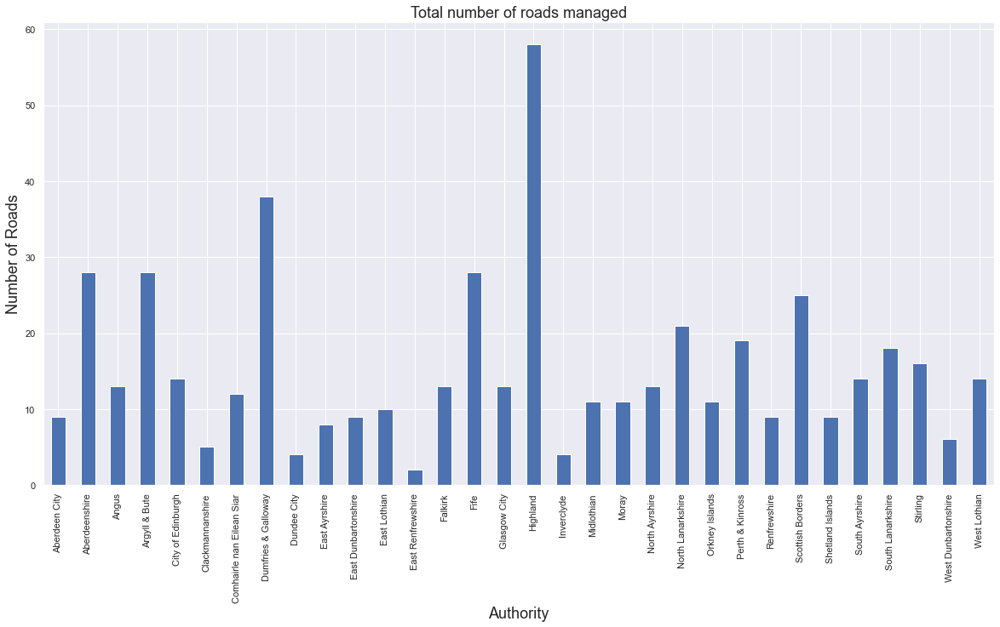

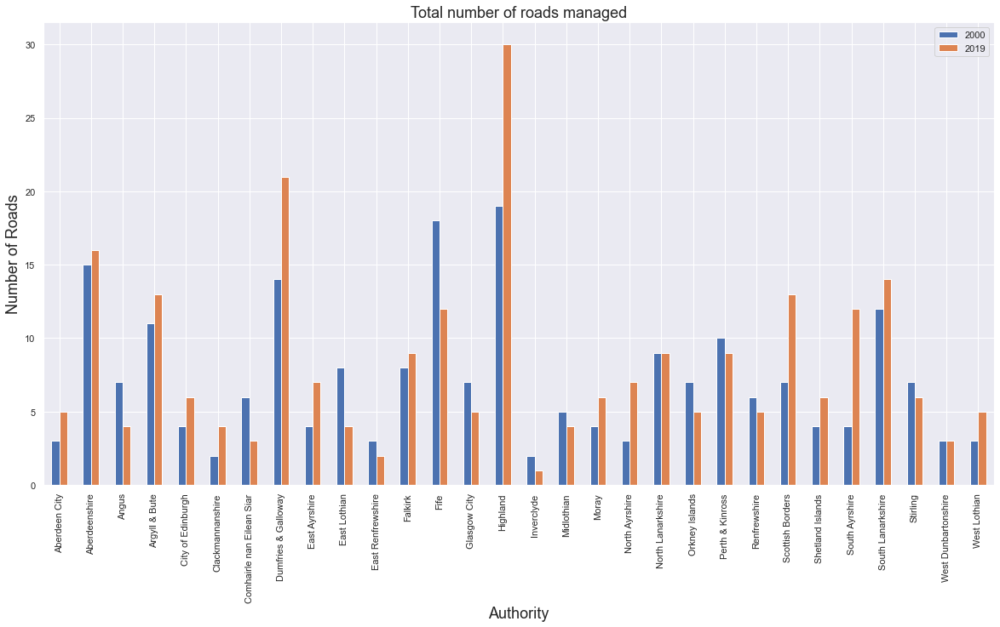

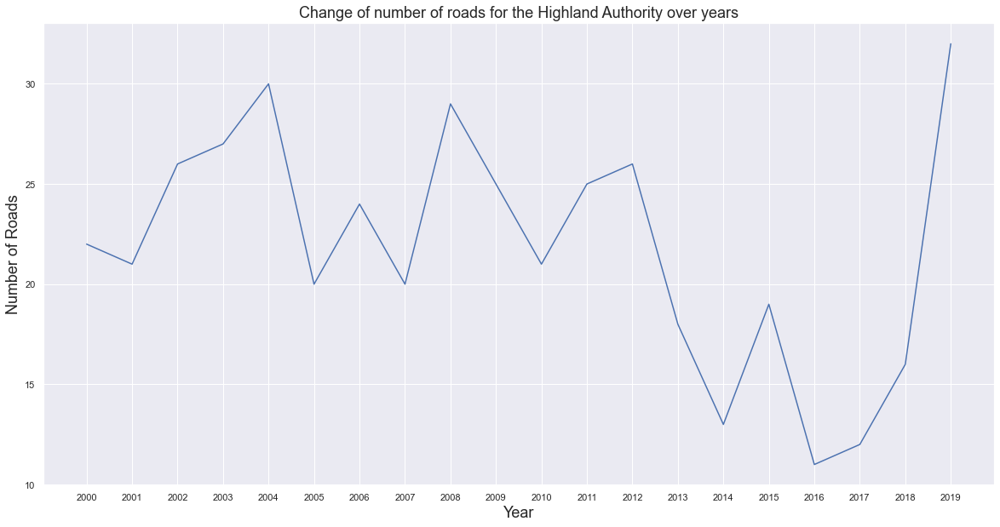

In [4]:
#reducing the dataframe to a manageable size containing the actual data needed
road_data = data[['local_authority_name','year','road_name']]

#removing road names C and U as they cannot be classfied as indivdual roads
road_data = road_data[road_data.road_name != 'C']
road_data = road_data[road_data.road_name != 'U']

#test to check if the new data has the correct number of rows.
#print(len(road_data['road_name'].unique()))

#total number of roads managed at any point in the dataset
total_roads = road_data.drop_duplicates(subset='road_name')
total_roads = total_roads[['local_authority_name', 'road_name']]
total_roads = total_roads.groupby('local_authority_name').count()

#total number of roads managed in the year 2000
year2000_data = road_data.loc[road_data['year'] == 2000]
year2000_data = year2000_data.drop_duplicates(subset='road_name')
year2000_data = year2000_data[['local_authority_name', 'road_name']]
year2000_data = year2000_data.groupby('local_authority_name').count()

#total number of roads managed in the year 2019
year2019_data = road_data.loc[road_data['year'] == 2019]
year2019_data = year2019_data.drop_duplicates(subset='road_name')
year2019_data = year2019_data[['local_authority_name', 'road_name']]
year2019_data = year2019_data.groupby('local_authority_name').count()

#reducing the data to the Highland authority to see how it has changed over the years
highland_data = road_data.loc[road_data['local_authority_name'] == 'Highland']
highland_data = highland_data[['year','road_name']]
ls = []
year = []
for i in range(2000,2020):
    l = highland_data.loc[highland_data['year'] == i]
    l = l.drop_duplicates(subset='road_name')
    ls.append(l['road_name'].count())
    year.append(i)

#combining the 2 year dataframes to create a better bar chart
combined_data = pd.merge(year2000_data, year2019_data, left_index=True, right_index=True)

#bar chart for the toal roads managed
plt.rcParams['figure.figsize'] = (20, 10)
bar_total = total_roads.plot.bar()
plt.title('Total number of roads managed', fontsize=18)
plt.xlabel('Authority',fontsize=18)
plt.ylabel('Number of Roads', fontsize=18)
plt.legend().remove()
plt.show()

#combined bar chart for the 2 roads choosen
plt.rcParams['figure.figsize'] = (20, 10)
bar_combined = combined_data.plot.bar()
plt.title('Total number of roads managed', fontsize=18)
plt.xlabel('Authority', fontsize=18)
plt.ylabel('Number of Roads', fontsize=18)
plt.legend(['2000','2019'])
plt.show()

#Line graph showing the changes of highland over time
plt.rcParams['figure.figsize'] = (20, 10)
plt.plot(year,ls)
plt.xticks(year)
plt.title('Change of number of roads for the Highland Authority over years', fontsize=18)
plt.xlabel('Year', fontsize=18)
plt.ylabel('Number of Roads', fontsize=18)
plt.show()

As you can see from the bar charts above, the Highland authority manages the most roads, or at least has the most counters on different roads.  This is expected as, although it is less populated, it is the largest region in Scotland.  We've compared the differences between the year 2000 and 2019.  This shows that there has been significant changes over time to the number of roads viewed by each authority. Because of this I've looked how the Highland authority has changed over the years.  The line graph shows that the data changes every year.  The reason this is the case, is out of the scope for this project. However, if I was to speculate, I would assume the authority did not deem it necessary to moniter every road every year as the Highlands is sparsely populated and receives less traffic.  As you can see from the second bar chart more populated regions have seen fewer changes. 

### The Longest Road and Road with Most Counters

A brief look at the longest road and determining which road has the most counters.

In [5]:
#reducing the data to a more useful dataframe
link_data = data[['count_point_id','link_length_km','road_name']]

#Drop empty rows in link length km column
link_data = link_data.dropna(subset=['link_length_km'])
link_data = link_data.drop_duplicates(subset='count_point_id')

link_length = link_data.groupby('road_name').sum()
counts = link_data.groupby('road_name').count()

#Sorting the dataframes 
link_length = link_length['link_length_km'].sort_values(ascending=False)
counts = counts['count_point_id'].sort_values(ascending=False)

print(f'The road with the most counters is the {counts.index[0]} with {counts[0]} counters.')
print(f'The longest road is the {link_length.index[0]}, which is {round(link_length[0],3)}km long.')

The road with the most counters is the A8 with 76 counters.
The longest road is the A9, which is 445.2km long.


One interesting thing that came from this, is that the longest road matches the official data.  The official data states that the A9 is the longest road and it is 439 km, which is very close to the results above.  This shows that the data is of a decent quality.  However, there were missing values for the link_length_km, which shows some of the data is missing, which may lead to inaccurate results.

### The Busiest Roads

A look into the busiest roads on average over the past 20 years in terms of number of vehicles per day.  Excluding the C and U roads.  

In [6]:
busy_data = data[['year', 'road_name','pedal_cycles', 'two_wheeled_motor_vehicles',
       'cars_and_taxis', 'buses_and_coaches', 'lgvs', 'all_hgvs', 'all_motor_vehicles']]
busy_data = busy_data[busy_data.road_name != 'C']
busy_data = busy_data[busy_data.road_name != 'U']

#Yearly total for each counter
year_total = busy_data.groupby('year').sum()
#Vehicle total per road
vehicle_total = busy_data.groupby(by=['road_name']).sum()


year_split = busy_data.groupby(['year','road_name']).sum()
avg_vehicles = year_split.groupby('road_name').mean()

#Sorting the data for each vehicle type
all_vehicles = avg_vehicles['all_motor_vehicles'].sort_values(ascending=False)
bike = avg_vehicles['pedal_cycles'].sort_values(ascending=False)
motorbike = avg_vehicles['two_wheeled_motor_vehicles'].sort_values(ascending=False)
cars = avg_vehicles['cars_and_taxis'].sort_values(ascending=False)
bus = avg_vehicles['buses_and_coaches'].sort_values(ascending=False)
lgvs = avg_vehicles['lgvs'].sort_values(ascending=False)
all_hgvs = avg_vehicles['all_hgvs'].sort_values(ascending=False)

#Setting up the lists
all_vehicles_roads = []
bike_roads = []
motorbike_roads = []
cars_roads = []
bus_roads = []
lgvs_roads = []
all_hgvs_roads = []

#Adding the top 5 
for i in range(5):
    all_vehicles_roads.append(all_vehicles.index[i])
    bike_roads.append(bike.index[i])
    motorbike_roads.append(motorbike.index[i])
    cars_roads.append(cars.index[i])
    bus_roads.append(bus.index[i])
    lgvs_roads.append(lgvs.index[i])
    all_hgvs_roads.append(all_hgvs.index[i])

#Creating the table
d = {'All Vehicles': all_vehicles_roads, 'Bikes': bike_roads, 'Motorbikes': motorbike_roads,\
    'Cars': cars_roads, 'Buses': bus_roads, 'LGVs': lgvs_roads, 'HGVs': all_hgvs_roads}
df = pd.DataFrame(data=d, index=[1,2,3,4,5])
df

,All Vehicles,Bikes,Motorbikes,Cars,Buses,LGVs,HGVs
1,M8,A8,M8,M8,M8,M8,M8
2,A90,A9000,A90,A90,A8,A90,M74
3,A8,A77,A8,A8,A90,A8,A90
4,M74,A814,A720,M74,A77,M74,A74M
5,M90,A900,A82,M90,A803,A720,A9


As you can see from the table the most popular road is the M8 for all vehicle types except bikes, which is expected as bikes cannot go on M roads in Scotland.  One interesting observation is that there seems to be a correlation between roads that are busy with HGVs but are not busy with bikes.  This is explored further in the next section.

### Vehicle Distribution and Road Types

This section looks into the way each vehicle type is distrubuted over all 5 road types.

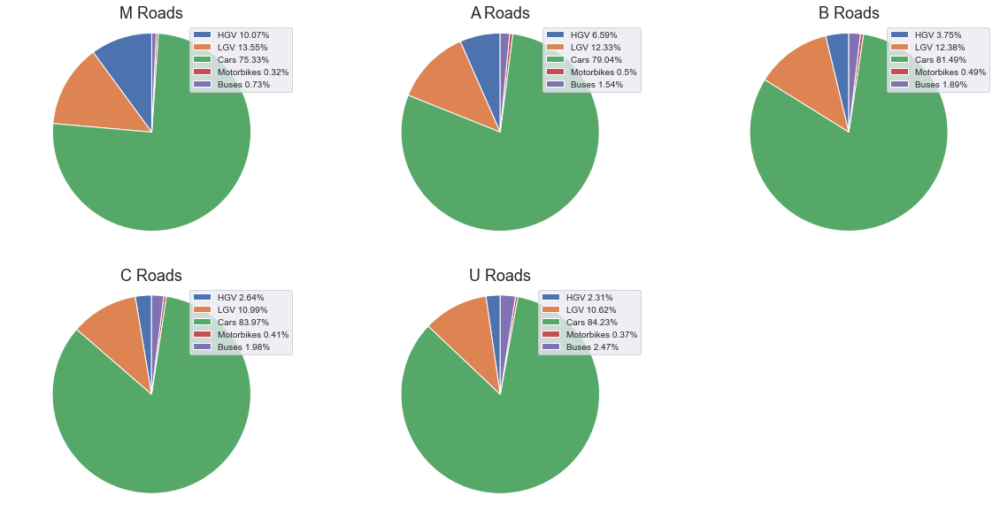

In [7]:
#Creating dataframes for each road type
M = data[data['road_name'].str.startswith('M')]
A = data[data['road_name'].str.startswith('A')]
B = data[data['road_name'].str.startswith('B')]
C = data[data['road_name'].str.startswith('C')]
U = data[data['road_name'].str.startswith('U')]


def chart_data(road):
    '''
    Function to produce the data for each road type in order to build the pie charts.
    Input: road type
    Output: labels, sizes
    '''
    hgv = road['all_hgvs'].sum() / road['all_motor_vehicles'].sum()
    lgv = road['lgvs'].sum() / road['all_motor_vehicles'].sum()
    car = road['cars_and_taxis'].sum() / road['all_motor_vehicles'].sum()
    motor = road['two_wheeled_motor_vehicles'].sum() / road['all_motor_vehicles'].sum()
    bus = road['buses_and_coaches'].sum() / road['all_motor_vehicles'].sum()
    labels = [f'HGV {round(hgv*100,2)}%', f'LGV {round(lgv*100,2)}%', f'Cars {round(car*100,2)}%',
          f'Motorbikes {round(motor*100,2)}%', f'Buses {round(bus*100,2)}%']
    sizes = [hgv, lgv, car, motor, bus]
    return (labels, sizes)

    
#M Roads pie chart
M_data = chart_data(M)
plt.subplot(231)
patches, texts = plt.pie(M_data[1], startangle=90)
plt.title('M Roads', fontsize = 18)
plt.axis('equal')
plt.legend(patches, M_data[0], loc="best", fontsize = 10)

#A Roads pie chart
A_data = chart_data(A)
plt.subplot(232)
patches, texts = plt.pie(A_data[1], startangle=90)
plt.title('A Roads', fontsize = 18)
plt.axis('equal')
plt.legend(patches, A_data[0], loc="best", fontsize = 10)

#B Roads pie chart
B_data = chart_data(B)
plt.subplot(233) 
patches, texts = plt.pie(B_data[1], startangle=90)
plt.title('B Roads', fontsize = 18)
plt.axis('equal')
plt.legend(patches, B_data[0], loc="best", fontsize = 10)

#C Roads pie chart
C_data = chart_data(C)
plt.subplot(234)
patches, texts = plt.pie(C_data[1], startangle=90)
plt.title('C Roads', fontsize = 18)
plt.axis('equal')
plt.legend(patches, C_data[0], loc="best", fontsize = 10)

#U Roads pie chart
U_data = chart_data(U)
plt.subplot(235)
patches, texts = plt.pie(U_data[1], startangle=90)
plt.title('U Roads', fontsize = 18)
plt.axis('equal')
plt.legend(patches, U_data[0], loc="best", fontsize = 10)
plt.show()

The results are as expected.  HGVs are mainly found on M roads, while bikes, buses and motorbikes have a higher percentage on smaller roads.  Intrestingly LGVs are found at a consistent rate on all road types.

## Traffic Patterns Over Time

### Annual Average Daily Flows

 <font face="Helvetica" size=3> 
 Using only the manual count data, to reproduce similar DfT graphs (https://roadtraffic.dft.gov.uk/regions/3)  
    In the manual count data, no link length for Minor road, therefore the graphs are drawn based on **major road data**.  
    Calculate annual average daily flows (AADF, average number of vehicles travelling per day in a given year) for each link, and multiplying this by the length of the link to get a total traffic volume for the whole country, in vehicle-miles. 

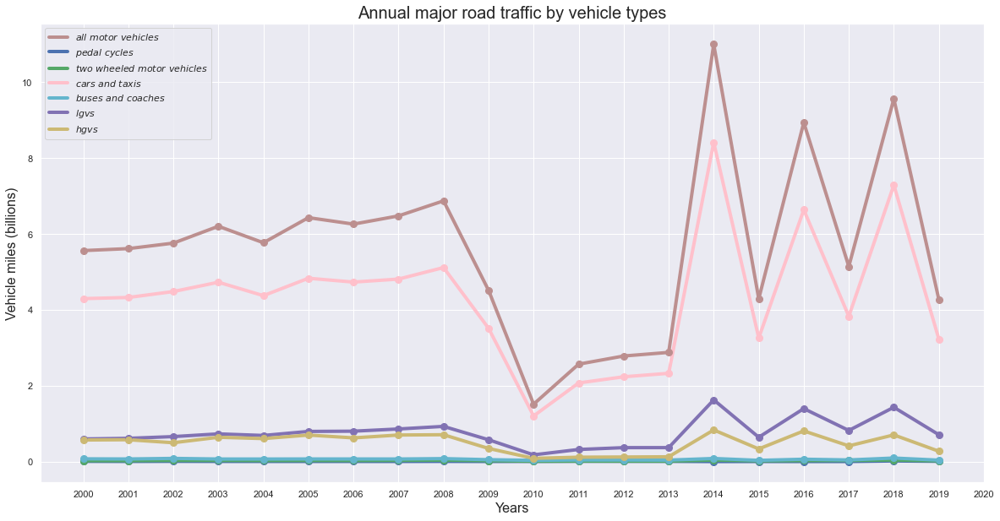

In [8]:
# Filter the major road
major_road = data.loc[data['road_type'].str.match('Major') == True]
major_road = major_road[['year', 'count_point_id', 'link_length_miles', 'all_motor_vehicles',
                         'pedal_cycles', 'two_wheeled_motor_vehicles', 'cars_and_taxis',
                         'buses_and_coaches', 'lgvs', 'all_hgvs', 'road_name']]

#Find the unique number of roads counted each year
road_num = []
for year in range(2000, 2020):
    sep = major_road.loc[major_road['year'] == year]
    id = sep['count_point_id']
    road_num.append(len(id.unique()))
        
def traffic_volume(vehicle):
    """
    Calculate the AADF and multiply by the length of the link and year day. 
    Calculate the traffic volume and output by list. 
    The road count of gov is 495, unit is billions, weighting each year statistic based on unique road num
    
    """
    major_road[f'AADF_{vehicle}'] = major_road[vehicle] * major_road['link_length_miles'] * 365
    volume = (major_road.groupby('year')[f'AADF_{vehicle}'].sum()).tolist()
    for i in range(20):
        volume[i] = volume[i] / road_num[i] * 495 / 1000000000
    return volume

all_motor_vehicles = traffic_volume('all_motor_vehicles')
pedal_cycles = traffic_volume('pedal_cycles')
two_wheeled_motor_vehicles = traffic_volume('two_wheeled_motor_vehicles')
cars_and_taxis = traffic_volume('cars_and_taxis')
buses_and_coaches = traffic_volume('buses_and_coaches')
lgvs = traffic_volume('lgvs')
all_hgvs = traffic_volume('all_hgvs')

# Reproduce similar graph by vehicle categories
year = [year for year in range(2000, 2020)]
fig, ax = plt.subplots(figsize=(20, 10))
ax.plot(year, all_motor_vehicles, color='rosybrown', label=r'$all\ motor\ vehicles$',linewidth=4)
ax.plot(year, pedal_cycles, color='b', label=r'$pedal\ cycles$',linewidth=4)
ax.plot(year,  two_wheeled_motor_vehicles, color='g', label=r'$two\ wheeled\ motor\ vehicles$',linewidth=4)
ax.plot(year, cars_and_taxis, color='pink', label=r'$cars\ and\ taxis$',linewidth=4)
ax.plot(year, buses_and_coaches, color='c', label=r'$buses\ and\ coaches$',linewidth=4)
ax.plot(year,  lgvs, color='m', label=r'$lgvs$',linewidth=4)
ax.plot(year, all_hgvs, color='y', label=r'$hgvs$',linewidth=4)

# Add the key point 
for i in year:
    ax.plot(i, all_motor_vehicles[i-2000], 'rosybrown', marker='o', markersize=8)
    ax.plot(i, pedal_cycles[i-2000], 'b', marker='o', markersize=8)
    ax.plot(i, two_wheeled_motor_vehicles[i-2000], 'g', marker='o', markersize=8)
    ax.plot(i, cars_and_taxis[i-2000], 'pink', marker='o', markersize=8)
    ax.plot(i, buses_and_coaches[i-2000], 'c', marker='o', markersize=8)
    ax.plot(i, lgvs[i-2000], 'm', marker='o', markersize=8)
    ax.plot(i, all_hgvs[i-2000], 'y', marker='o', markersize=8)

# Adjust the graph
ax.set_xticks(np.linspace(2000,2020,21))
ax.set_xlabel('Years', fontsize=16)
ax.set_ylabel('Vehicle miles (billions)', fontsize=16)
ax.set_title('Annual major road traffic by vehicle types', fontsize=20)
ax.legend(loc='upper left')
ax.grid(True)
plt.show()

The traffic volume of all vehicles in major road increased steadily from 2000 to 2008, but it dramatically dropped between 2008 and 2010. After 2010-2013 slight growth, the statistic fluctuated in the next 6 years. The volume of cars and taxis is the leading factor.   

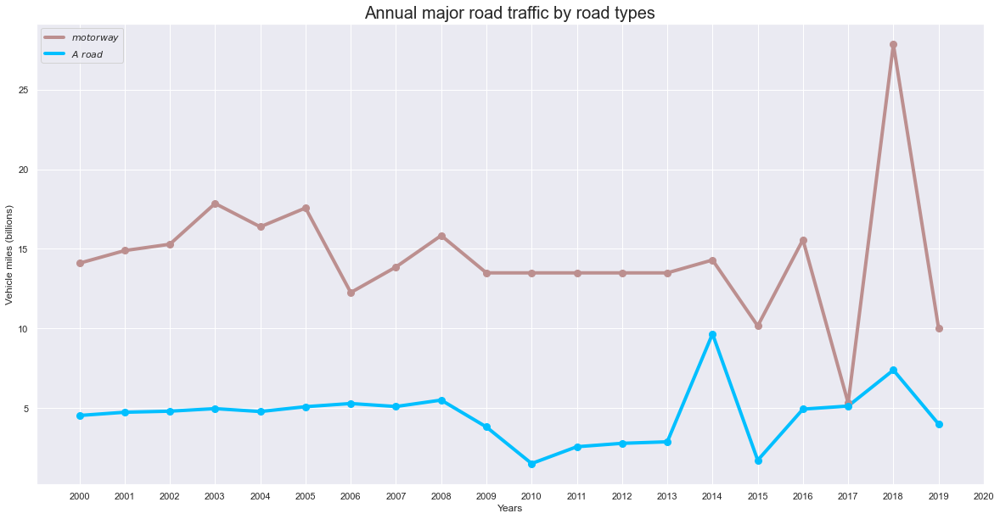

In [9]:
# Filter the data of motoraway
motorway = major_road.loc[major_road['road_name'].str.startswith('M')]
motorway = motorway[['count_point_id', 'year', 'link_length_miles', 'all_motor_vehicles']]
motorway['AADF_motorway'] = motorway['all_motor_vehicles'] * motorway['link_length_miles'] * 365

# Filter the data of A road
A_road = major_road.loc[major_road['road_name'].str.startswith('A')]
A_road = A_road[['count_point_id', 'year', 'link_length_miles', 'all_motor_vehicles']]
A_road['AADF_Aroad'] = A_road['all_motor_vehicles'] * A_road['link_length_miles'] * 365

# Calculate the traffic volume
AADFs_motorway = np.zeros(20)
for year in range(2000, 2020):
    sep = motorway.loc[motorway['year'] == year]
    id = sep['count_point_id']
    road_num = len(id.unique())
    
    # Assume the data for missing year equals to the last year
    if road_num:
        AADFs_motorway[year - 2000] = sep['AADF_motorway'].sum() / road_num * 495 / 1000000000
    else:
        AADFs_motorway[year - 2000] = AADFs_motorway[year - 2001]

AADFs_Aroad = np.zeros(20)
for year in range(2000, 2020):
    sep = A_road.loc[A_road['year'] == year]
    id = sep['count_point_id']
    road_num = len(id.unique())
    
    # Assume the data for missing year equals to the last year
    if road_num:
        AADFs_Aroad[year - 2000] = sep['AADF_Aroad'].sum() / road_num * 495 / 1000000000
    else:
        AADFs_Aroad[year - 2000] = AADFs_Aroad[year - 2001]

# Reproduce similar graphs by vehicle categories
year = [year for year in range(2000, 2020)]
fig, ax = plt.subplots(figsize=(20, 10))
ax.plot(year, AADFs_motorway, color='rosybrown', label=r'$motorway$',linewidth=4)
ax.plot(year, AADFs_Aroad, color='deepskyblue', label=r'$A\ road$',linewidth=4)

# Add the key point 
for i in year:
    ax.plot(i, AADFs_motorway[i-2000], 'rosybrown', marker='o', markersize=8)
    ax.plot(i, AADFs_Aroad[i-2000], 'deepskyblue', marker='o', markersize=8)

# Adjust the graph
ax.set_xticks(np.linspace(2000,2020,21))
ax.set_xlabel('Years')
ax.set_ylabel('Vehicle miles (billions)')
ax.set_title('Annual major road traffic by road types', fontsize=20)
ax.legend(loc='upper left')
ax.grid(True)
plt.show()

The traffic volume of two types of major road changes not that constantly. Generally, more traffic volume on motorway than A road and also the volatility of the traffic volume on motorway is higher than that of A road between 2000 and 2019. 

### Bicycles on Different Roads

<font face="Helvetica" size=3> 
What is the most likely time of the day to find a bicycle on a C-road?   
    On other types of road? 

In [10]:
# Average number of cycles by road types, by hour
# Read the database
roads = data[['hour', 'pedal_cycles', 'road_name']]

# Filter the roads, group by hour and get the average pedal bikes by hour

C_road = roads.loc[roads['road_name'].str.startswith('C')
                  ].groupby(['hour']).mean().rename(columns = {"pedal_cycles":"Average bicylces - C Road"})
A_road = roads.loc[roads['road_name'].str.startswith('A')
                  ].groupby(['hour']).mean().rename(columns = {"pedal_cycles":"Average bicylces - A Road"})
B_road = roads.loc[roads['road_name'].str.startswith('B')
                  ].groupby(['hour']).mean().rename(columns = {"pedal_cycles":"Average bicylces - B Road"})
M_road = roads.loc[roads['road_name'].str.startswith('M')
                  ].groupby(['hour']).mean().rename(columns = {"pedal_cycles":"Average bicylces - M Road"})
U_road = roads.loc[roads['road_name'].str.startswith('U')
                  ].groupby(['hour']).mean().rename(columns = {"pedal_cycles":"Average bicylces - U Road"})

# Join results 
round(C_road.join(A_road, on='hour').join(B_road, on='hour').join(M_road, on='hour').join(U_road, on='hour'),2)

,Average bicylces - C Road,Average bicylces - A Road,Average bicylces - B Road,Average bicylces - M Road,Average bicylces - U Road
hour,,,,,
7,0.90,1.55,0.81,0.03,1.03
8,1.28,1.72,0.89,0.03,1.35
9,0.74,0.93,0.59,0.07,0.65
10,0.54,0.70,0.60,0.04,0.50
11,0.54,0.72,0.66,0.06,0.56
12,0.62,0.78,0.65,0.06,0.60
13,0.64,0.80,0.64,0.04,0.62
14,0.62,0.82,0.62,0.05,0.68
15,0.81,0.98,0.77,0.05,1.02


In [11]:
print("Most likely times to find pedal bikes by road:")
print(C_road.groupby(['hour']).mean().sort_values('Average bicylces - C Road', ascending=False).head(1))
print(A_road.groupby(['hour']).mean().sort_values('Average bicylces - A Road', ascending=False).head(1))
print(B_road.groupby(['hour']).mean().sort_values('Average bicylces - B Road', ascending=False).head(1))
print(M_road.groupby(['hour']).mean().sort_values('Average bicylces - M Road', ascending=False).head(1))
print(U_road.groupby(['hour']).mean().sort_values('Average bicylces - U Road', ascending=False).head(1))

Most likely times to find pedal bikes by road:
      Average bicylces - C Road
hour                           
17                     1.497218
      Average bicylces - A Road
hour                           
17                     1.959894
      Average bicylces - B Road
hour                           
17                      1.19617
      Average bicylces - M Road
hour                           
9                      0.066406
      Average bicylces - U Road
hour                           
17                     1.487948


The most likely time of the day to find a bicycle on a **C-road**, **A-road**, **B-road** and **U-road**  is from **17:00 to 18:00**. <br/>
The most likely time of the day to find a bicycle on a motorway is from 9:00 to 10:00.
It should be noticed that pedal cycles are **illegal** on motorways.


<font face="Helvetica" size=3> 
    What are the most likely weeks of the year to find a bicycle anywhere?

In [12]:
pd.options.mode.chained_assignment = None
df = data[['count_date', 'pedal_cycles']]
df['count_date'] = pd.to_datetime(df['count_date'])
# Set date time index
df['week'] = df['count_date'].dt.week
# Group by week
df.groupby('week').mean().sort_values('pedal_cycles', ascending=False).head(5)

,pedal_cycles
week,
45,2.565476
36,1.192673
26,1.156990
27,1.102381
20,1.101350


The most likely weeks of the year to find a bicycle anywhere is **week 45**. 

<font face="Helvetica" size=3> 
Heat map of pedal cycles

Text(0.5, 1.0, 'Pedal cycles weekday distribution')

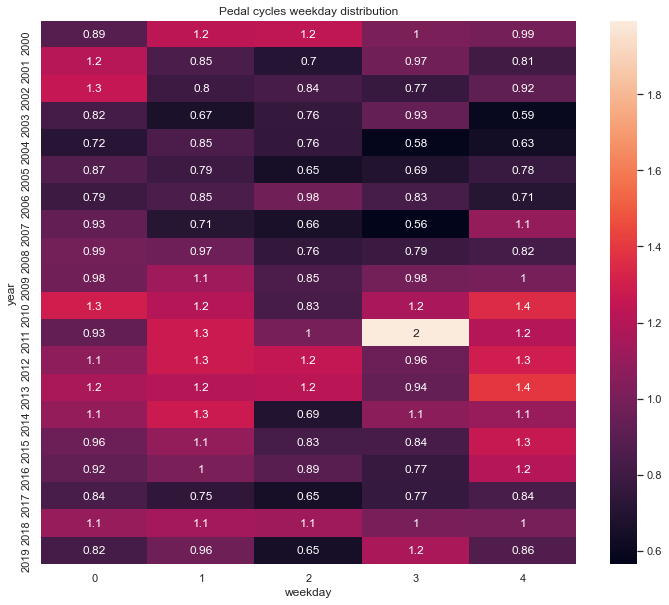

In [13]:
df = data[['count_date', 'pedal_cycles']]

# Set date time index
df['count_date'] = pd.to_datetime(df['count_date'])
df['year'] = df['count_date'].dt.year
df['weekday'] = df['count_date'].dt.dayofweek

# Make the heat map table
week = pd.pivot_table(data = df.iloc[:,1:],values = 'pedal_cycles', 
                        index = 'year', columns = 'weekday')
# Set the size of heat map
fig, ax = plt.subplots(figsize=(12,10))
ax = sns.heatmap(week, annot=True)
ax.set_title('Pedal cycles weekday distribution')

Text(0.5, 1.0, 'Pedal cycles daily distribution')

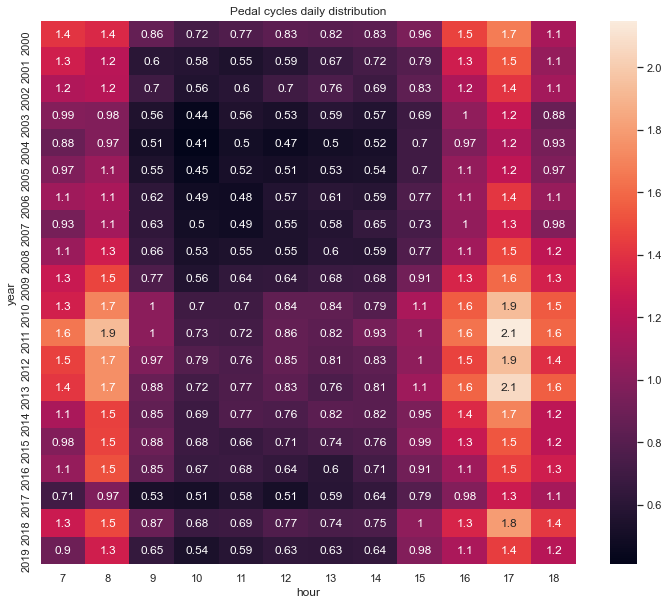

In [14]:
df = data[['count_date', 'hour', 'pedal_cycles']]

# Set date time index
df['count_date'] = pd.to_datetime(df['count_date'])
df['year'] = df['count_date'].dt.year

# Make the heat map table
daytime = pd.pivot_table(data = df.iloc[:,1:],values = 'pedal_cycles', 
                        index = 'year', columns = 'hour')

# Set the size of heat map
fig, ax = plt.subplots(figsize=(12,10))
ax = sns.heatmap(daytime, annot=True)
ax.set_title('Pedal cycles daily distribution')

Over the 20-year period,the number of bicycles slightly increased. People prefer to ride bicycle in the morining(7:00 - 8:00) and afternoon(16:00 - 18:00), the most preference time is between 17:00 and 18:00. Also, since 2010, the statistic of bicycle use incresed in working days and the highet pedal cycles volume commonly appears on Friday. 

### Vehicle Patterns Throughout the Day

<font face="Helvetica" size=3> 
Identify patterns in vehicle counts depending on the time of the day. 

Text(0.5, 1.0, 'All hgvs')

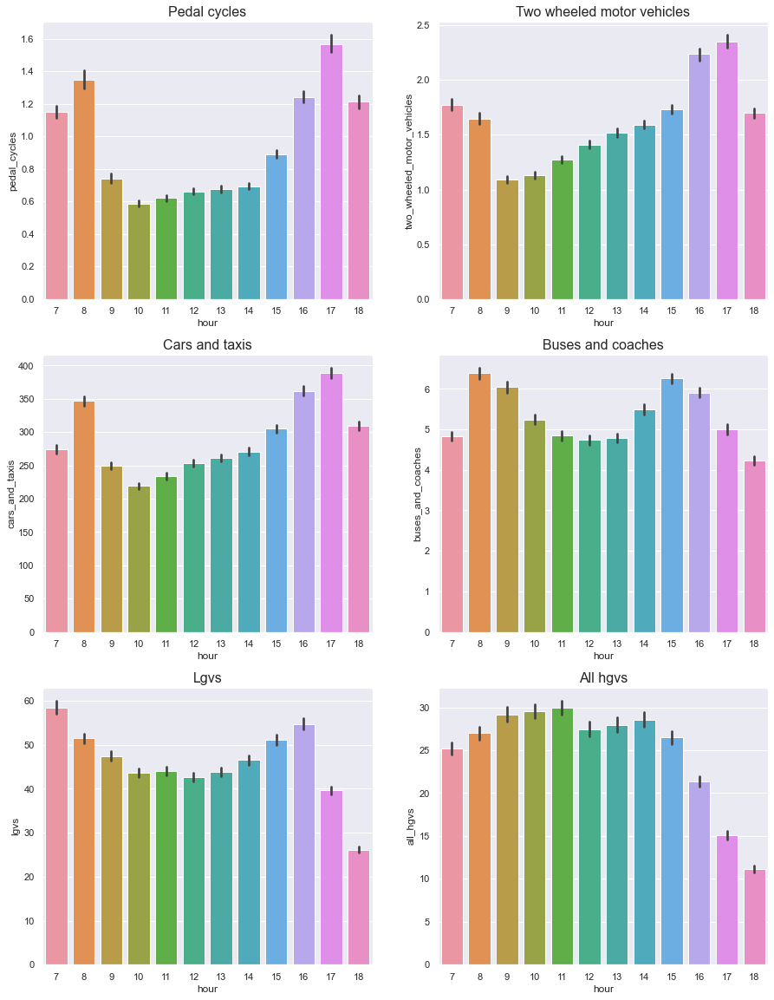

In [15]:
plt.figure(figsize = (15, 20))
plt.subplot(3,2,1)
sns.barplot(x="hour", y="pedal_cycles", data=data)
plt.title('Pedal cycles', fontsize = 16)
plt.subplot(3,2,2)
sns.barplot(x="hour", y="two_wheeled_motor_vehicles", data=data)
plt.title('Two wheeled motor vehicles', fontsize = 16)
plt.subplot(3,2,3)
sns.barplot(x="hour", y="cars_and_taxis", data=data)
plt.title('Cars and taxis', fontsize = 16)
plt.subplot(3,2,4)
sns.barplot(x="hour", y="buses_and_coaches", data=data)
plt.title('Buses and coaches', fontsize = 16)
plt.subplot(3,2,5)
sns.barplot(x="hour", y="lgvs", data=data)
plt.title('Lgvs', fontsize = 16)
plt.subplot(3,2,6)
sns.barplot(x="hour", y="all_hgvs", data=data)
plt.title('All hgvs', fontsize = 16)

**The pattern of pedal cycles**:

**High volume time**: 8:00 to 9:00 and 17:00 to 18:00  
**Low volume time**: 10:00 to 11:00 

**The pattern of two wheeled motor vehicles**: 

**High volume time**: 16:00 to 17:00 and 17:00 to 18:00  
**Low volume time**: 9:00 to 10:00 and 10:00 to 11:00 

**The pattern of cars and taxis**: 

**High volume time**: 8:00 to 9:00 and 17:00 to 18:00  
**Low volume time**: 10:00 to 11:00 

**The pattern of buses and coaches**: 

**High volume time**: 8:00 to 9:00 and 15:00 to 16:00  
**Low volume time**: 18:00 to 19:00 

**The pattern of lgvs:**

**High volume time**: 7:00 to 8:00 and 16:00 to 17:00  
**Low volume time**: 18:00 to 19:00  

**The pattern of all hgvs:**

**High volume time**: 10:00 to 11:00 and 11:00 to 12:00  
**Low volume time**: 18:00 to 19:00

The patterns of pedal cycles and two wheeled motor vehicles are similar, the volume concentrate on 7:00 - 8:00 and 16:00 - 18:00. Cars and taxis have high volume on 8:00 - 9:00 and 16:00 - 18:00 and buses and coaches on 8:00 - 10:00 and 15:00 - 17:00. Lgvs and hgvs show diverse daytime pattern. Lgvs concentrate on 7:00 - 8:00 and 16:00 - 17:00 while hgvs concentrate between 8:00 and 16:00. 

## Geographic Analysis

### Preparing the Shape Data

Some of our geographic charts require external shape data which is loaded in and prepared here:

In [16]:
# Local Authority shape data:

# Read files 
gb_shape = gpd.read_file('shape_files/Local_Authority_Districts__December_2017__Boundaries_GB_BSC.shp')
local_authorities = pd.read_csv('shape_files/Local_Authority_Districts__December_2017__Boundaries_GB_BSC.csv')['LAD17NM']

# Get shape data for Scotland only
sco_shape = gb_shape.assign(local_authority_name = local_authorities).loc[326:357,]
local_districts = sco_shape[['local_authority_name', 'geometry']]

# Convert from northing/easting to lat/long 
la_shape = local_districts.set_crs(epsg=27700).to_crs(epsg=4326)

# Update local authority names to match the shape file
data = data.replace({'local_authority_name': 
                     {'Argyll & Bute':'Argyll and Bute',
                      'Comhairle nan Eilean Siar':'Na h-Eileanan Siar',
                      'Dumfries & Galloway':'Dumfries and Galloway', 
                      'Perth & Kinross':'Perth and Kinross'
                     }
                    }).sort_values('local_authority_name')

# UK road map shape data:

# Read file and convert to lat/long
roads = gpd.read_file('shape_files/MRDB_2019_published.shp').set_crs(epsg=27700).to_crs(epsg=4326)

### The code below was used to get the indices of roads in Scotland only (the entire UK took too long to plot)
### It takes a long time to run so it was run once and the results were saved so they can be accessed quickly

## Get the Scotland local authority shapes and convert to correct form:
# sco = sco_shape.geometry.set_crs(epsg=27700).to_crs(epsg=4326)

## Get a representative point on each road line:
# points = roads.geometry.representative_point().to_crs(epsg=4326)

## Calculate the distance between each point and each of the local authority shapes,
## If any of the distances are small, they are in Scotland so add to the list:
#sco_roads = []
#for point in range(len(points)):
#    if any(sco.distance(points[point]) < 0.1): # get the roads close to Scotland
#        sco_roads.append(point)

## Save the indices of the Scottish roads to a file:
#with open(f"shape_files/scotland_roads_inx.txt", "a+") as file:
#    file.write(f"{sco_roads}")

### Count Point Locations

Over the past 20 years, the Department of Transport have recorded traffic data at a total of 3,963 count points in Scotland. To look more closely into the distribution of these points, they are plotted on a map of Scotland:

In [17]:
# Cluster Map of Count Point Locations

# Get a unique list of count points and plot a map of Scotland
locations = data[['latitude','longitude']].drop_duplicates()
count_points = folium.Map(location=[55.953251,-3.1883], zoom_start=7)

# Add marker cluster which gathers and counts the count points
cluster = MarkerCluster()
for idx, row in locations.iterrows():
    cluster.add_child(folium.Marker([row['latitude'], row['longitude']]))
    count_points.add_child(cluster)

count_points

This plot shows the distribution of the count point locations across Scotland.  Zooming in, it appears that the Department for Transport has thoroughly covered the whole country over the past 20 years, even remote islands in the Hebrides and the Shetland and Orkney Islands have multiple count points. As expected, there are more points in the more densely populated areas such as the central belt which includes Glasgow and Edinburgh. There are also larger counts in the cities of Dundee, Aberdeen and Inverness.   <br/>
Note: It also highlights some data quality issues where incorrect coordinates have been recorded. For example, points in the sea in the Moray firth and a point in Northern Ireland.

### Frequency of Counts

Although the count points are very well distributed, the DfT does not perform counts on every road every year. To investigate how frequently they are done in each of the local authority areas, the total number of counts per year are plotted in an animation:

In [18]:
# Get the totals number of counts performed in each local authority each year
count_data = data[["count_point_id", "local_authority_name", "year"]].drop_duplicates()

def totals(year):
    totals = count_data[count_data.year == year].groupby('local_authority_name').count()[['count_point_id']]
    totals['year'] = year 
    return(totals)

count_totals = totals(2000)
for year in range(2001, 2020):
    count_totals = count_totals.append(totals(year))

count_totals = count_totals.rename(columns = {"count_point_id":"Number of counts"})

# Create a bar chart animation showing the number of counts in each local authority each year
fig = px.bar(count_totals, x = count_totals.index, y = "Number of counts",
             animation_frame = "year", animation_group = count_totals.index,
             color = count_totals.index, range_y = [0, 70], title = "Number of Counts Performed by Local Authority")

# Adjust frame change speed and slider position
fig.update_layout(transition = {'duration': 2000})
fig['layout']['updatemenus'][0]['pad'] = dict(r = 10, t = 150)
fig['layout']['sliders'][0]['pad'] = dict(r = 10, t = 150,)
fig.show()

Interestingly, not all years have the same numbers of counts, for example in 2016 and 2017, there appears to have been much fewer counts in all areas, especially in comparison to 2018. The areas which tend to have the highest number of counts per year are Glasgow, Highland and Aberdeenshire. The highest annual count is in Aberdeenshire in 2018 with 66 in total, which seems unsual as it is not a particularly large area and it is not very densely populated. More remote areas like Shetland and Clackmannashire have less than 10 counts per year. 

### City of Edinburgh Commuters

The main roads that run into Edinburgh City Center are:
- From the East: A90, M8, A71
- From the South: A702, A701, A772, A7
- From the West: A68, A6106, A1

These roads are commonly used by commuters. To investigate potential patterns, we analyse the times of day and direction of travel of cars and taxis counted on these roads:

In [19]:
# Get data for the Edinburgh commuter roads

with open(f"shape_files/scotland_roads_inx.txt", "r") as file:
    sco_inx = file.read()

roads = roads.iloc[list([int(i) for i in (sco_inx[1:-1].split(","))])]
ring_road = ['A90', 'M8', 'A71', 'A702', 'A701', 'A772', 'A7', 'A68', 'A6106', 'A1']
edi = data[data.road_name.isin(ring_road) & 
          (data.local_authority_name.isin(['City of Edinburgh','Midlothian'])) &
          (data.latitude > 55.87) & (data.longitude < -3) & (data.longitude > -3.38)]
edi_count_points = edi.groupby('count_point_id').min()

In [20]:
# Plot map of Edinburgh
edinburgh = folium.Map([55.89,-3.18], zoom_start=10.5, tiles='cartodbpositron')

# Add chloropleth with road outlines and markers to show point locations
chloro = folium.Choropleth(geo_data = roads.__geo_interface__).add_to(edinburgh)

# Add markers for count points
for i, row in edi_count_points.iterrows():
    folium.Marker([row['latitude'], row['longitude']], 
                  popup = (row['road_name'])).add_to(edinburgh)

edinburgh

Text(0, 0.5, 'Number of Motor Vehicles Recorded')

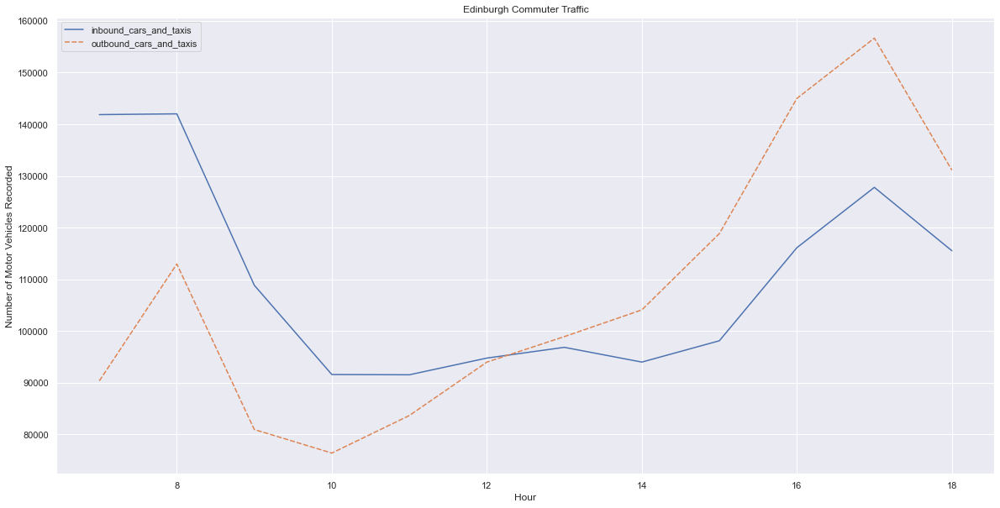

In [21]:
# Separate inbound and outbound traffic
inbound = edi[(edi.road_name.isin(['A90', 'M8', 'A71']) & edi.direction_of_travel.isin(['E']))|
(edi.road_name.isin(['A702', 'A701', 'A772', 'A7', 'A68', 'A6106', 'A1']) & 
 edi.direction_of_travel.isin(['N', 'W']))].rename(columns = {"cars_and_taxis":"inbound_cars_and_taxis"})

outbound = edi[(edi.road_name.isin(['A90', 'M8', 'A71']) & edi.direction_of_travel.isin(['W']))|
(edi.road_name.isin(['A702', 'A701', 'A772', 'A7', 'A68', 'A6106', 'A1']) & 
 edi.direction_of_travel.isin(['S', 'E']))].rename(columns = {"cars_and_taxis":"outbound_cars_and_taxis"})
inbound

# Join dataframes and add row totals
results = inbound.groupby('hour').sum()[['inbound_cars_and_taxis']
    ].join(outbound.groupby('hour').sum()[['outbound_cars_and_taxis']], on = 'hour')

# Plot traffic over time 
ax = sns.lineplot(data=results)
ax.set_title('Edinburgh Commuter Traffic')
ax.set_xlabel('Hour')
ax.set_ylabel('Number of Motor Vehicles Recorded')

In [22]:
# Add row totals and net_traffic_flow column
results.loc["Total"] = results.sum()
results['net_traffic_flow'] =  results.inbound_cars_and_taxis - results.outbound_cars_and_taxis
results

,inbound_cars_and_taxis,outbound_cars_and_taxis,net_traffic_flow
hour,,,
7,141863,90338,51525
8,142013,112956,29057
9,108842,80934,27908
10,91575,76375,15200
11,91523,83643,7880
12,94756,93973,783
13,96837,98908,-2071
14,93982,104080,-10098
15,98104,118840,-20736


Since the total number of cars and taxis recorded on these roads in both directions was quite similar, it seems that most of them could be commuters. The difference could be explained by workers who left their workplaces later in the evening, after the count has ended, or those who took a different route home. However, it could also be local traffic. The largest volume of inbound traffic was recorded between 7 and 9am. The largest volume of outbound traffic was recorded between 4 and 6pm. This is in line with the times that commuters would drive or take the bus to work. There are also increases in traffic out of Edinburgh in the mornings and back into the city in the evenings which suggests that people also commute from Edinburgh. Overall, the net traffic flow is positive for the first half of the day then negative afterwards.

### Heavy Goods Vehicle Border Crossings
The major roads which cross the Scottish border are the A74 (M), A7, A68, A697 and A1. The closest count points to these crossings, from East to West, are; (55.0, -3.05), (55.05, -2.96), (55.36, -2.48), (55.65, -2.24) and (55.81, -2.04). Most of the minor roads that cross the border do not have nearby counting points or if they do, there are other junctions between the border crossings and local roads. Therefore it is assumed that these roads are mostly used by local traffic and heavy goods vehicles would only cross the border on major roads. We can estimate the numb er of HGV crossing the border per day by looking at the data from these count points:

In [23]:
# Crossing point information

cross_ids = (80513, 20718, 10731, 30874, 30709)
coordinates = data[data.count_point_id.isin(cross_ids)][
    ['latitude', 'longitude', 'road_name', 'count_point_id']].drop_duplicates()

# Plot a map of the border area
border_crossings = folium.Map(location=[54.5,-2.5], zoom_start=7)

# Plot crossing points on a map as markers
for i, row in coordinates.iterrows():
    folium.Marker([row['latitude'], row['longitude']], 
           popup = (row['road_name'])).add_to(border_crossings)

border_crossings

In [24]:
road_names = coordinates[['count_point_id','road_name']]

# Find the average daily HGV crosses at each crossing point
crosses = data.loc[data['count_point_id'].isin(cross_ids)].groupby('count_date').agg(
          {'count_point_id':'mean','all_hgvs':'sum'}).groupby('count_point_id').mean().rename(
          columns = {"all_hgvs":"Average HGV Crosses"})

# Join back with the road names and display results
result = road_names.join(crosses, on = 'count_point_id').iloc[:,-2:].set_index('road_name')[['Average HGV Crosses']]
result.loc["Total"] = result.sum()
result

,Average HGV Crosses
road_name,
M74,6482.0
A7,489.0
A1,1179.0
A698,271.5
A68,244.0
Total,8665.5


The most popular border crossing point for heavy goods vehicles is the A74 (M). This joins with the M6 in England, which is the UK's longest motorway. The sum of the average number of HGV crossing the border each day at all 5 crossing points is 8665.5. Assuming that the number of HGVs crossing the border at night is the same as it is during the daytime, an estimate of the daily total is 17,331. From this, we can estimate that over 6 million heavy goods vehicles cross the border annually. There are similar numbers of HGV going northbound and southbound but excact numbers cannot be calculated since some results from the A1 crossing point has undetermined directions. Additionally, since some of the counts used to generate this estimate go back as far as 20 years, this estimate assumes that the rate of HGVs crossing the border has remained constant in this time frame. According to the Lorries (Heavy Goods Vehicles) section of [Road Traffic Estimates: Great Britain 2019](https://assets.publishing.service.gov.uk/government/uploads/system/uploads/attachment_data/file/916749/road-traffic-estimates-in-great-britain-2019.pdf) (pg 11), total lorry traffic in the UK has remained fairly stable except for a dip after the 2008 recession, which it has since recovered from.

### Traffic Volume by Local Authority

To visualise traffic volume by area, we calculate the total volume by local authority and plot on chloropleth maps. This is done for all motor vehicles and pedal cycles:

In [25]:
# To plot aggregated data on a choropleth map for each local authorty using folium,
# the required data needs to be input as a dictionary

# Get sums of traffic stats by local authority
plot_data = data.groupby('local_authority_name').sum().iloc[:,-13:].sort_values('local_authority_name')

# Convert required data to lists
cycles = plot_data['pedal_cycles'].to_list()
all_mv = plot_data['all_motor_vehicles'].to_list()
la_list = data['local_authority_name'].drop_duplicates().to_list()

# Add lists into dictionaries
bicycles = {}; all_motor_vehicles = {}
for i in range(len(la_list)):
    bicycles[la_list[i]] = cycles[i]
    all_motor_vehicles[la_list[i]] = all_mv[i]

In [26]:
# Bicycle Traffic Volume by Local Authority

# Plot a map of Scotland
all_bicylces = folium.Map(location=[55.5,-4.2], tiles='cartodbpositron',zoom_start=7)

# Add choropleth map with regional traffic volume
chloro = folium.Choropleth(geo_data = la_shape.__geo_interface__, data = bicycles,
           key_on = 'feature.properties.local_authority_name', 
           fill_color = 'YlGn', legend_name ='Bicycles').add_to(all_bicylces)

# Add labels to regions
chloro.add_to(all_bicylces).geojson.add_child(folium.features.GeoJsonTooltip(['local_authority_name']))

all_bicylces

The local authority with the largest volume of motor vehicle traffic over the past 20 years is Glasgow City:

In [27]:
# Motor Vehicle Traffic Volume by Local Authority

# Plot a map of Scotland
all_motors = folium.Map(location=[55.5,-4.2], tiles='cartodbpositron',zoom_start=7)

# Add a choropleth map with regional bicycle traffic volume
chloro = folium.Choropleth(geo_data = la_shape.__geo_interface__, data = all_motor_vehicles,
           key_on = 'feature.properties.local_authority_name', 
           fill_color = 'PuRd', legend_name ='All Motor Vehicles')

# Add labels to regions
chloro.add_to(all_motors).geojson.add_child(folium.features.GeoJsonTooltip(['local_authority_name']))
all_motors

The areas with the highest bicyles counts are the larger cities. Edinburgh City has a particularly high count:

### Vehicle Patterns in Specific Areas

To explore vehicle patterns in specific areas, counts are plotted on maps as circles, where the radiuses represent the relative size of the count. This is done for HGV in Glasgow and buses and coaches in the Aberdeen: 

In [28]:
# Heavy Goods Vehicles in Glasgow City

# Get the sum of HGVs recorded at each count point in Glasgow
glasgow = data[data.local_authority_name == 'Glasgow City']
hgv_data = glasgow.groupby('count_point_id').agg({'all_hgvs':'sum','latitude':'mean', 'longitude':'mean'}) 

# Plot a map of Glasgow
hgv = folium.Map(location=[55.85,-4.25], tiles='cartodbpositron',zoom_start=13)

# Add a bubble map showing the where hgvs were counted
for i, row in hgv_data.iterrows():
    folium.Circle(location = [row['latitude'], row['longitude']],
        # The size of the bubbles is determined by the number of HGVs recorded at each point
        radius = row['all_hgvs']/500, color = 'orange').add_to(hgv)
    
hgv


Heavy goods vehicles are generally only recorded on the outskirts and not directly in the city center. There are much higher counts on the M8 motorway.

In [29]:
# Buses and Coaches in Aberdeen City

# Get the sum of the bus and coach counts for each count point in Aberdeen
highlands = data[data.local_authority_name == 'Aberdeen City']
bus_data = highlands.groupby('count_point_id').agg({'buses_and_coaches': 'sum', 'latitude':'mean', 'longitude':'mean'}) 

# Plot a map of the highlands
buses = folium.Map(location=[57.1,-2], tiles='cartodbpositron',zoom_start=11)

# Add a bubble map showing where the buses were counted
for i, row in bus_data.iterrows():
    folium.Circle(location = [row['latitude'], row['longitude']],
        # The size of the bubbles is determined by the number of buses and coaches recorded at each point
        radius = row['buses_and_coaches']/10).add_to(buses)

buses

There are larger counts of buses and coaches in the city center and smaller counts on the outskirts.

### The North Coast 500 Route and Tourism in the Northern Highlands

The NC500 is a 516-mile scenic route around the north coast of Scotland. It was introduced in March 2015 and results of a survey by the Highlands and Islands Enterprise suggested that the it led to 29,000 more people visiting the area in its first year.
To investiate how this initiative has impacted traffic levels in the area, we can analyse the traffic counts on these roads before and after March 2015.

In [30]:
# Get the count data for NC500 area
NC_data = data[(data.latitude >= 57.59) & (data.latitude <= 58.7) & 
          (data.longitude >= -5.7) & (data.longitude <= -2) &
          (data.local_authority_name == 'Highland') &
          (data.year >= 2012) & (data.year <= 2017)]

# Count the number of counts performed at each count point
NC_points = NC_data[['count_point_id','year','longitude','latitude']].drop_duplicates()
point_counts = NC_points.groupby('count_point_id').count()

# Select the ones with more than one and get their ids
points = point_counts[point_counts.year > 1].index.to_list()
focus_points = NC_data[NC_data.count_point_id.isin(points)]

points

[940006, 940407, 967525, 979064, 982182, 990176]

It turns out that there are 6 count points which have count data for all 6 years of interest. These are plotted to check the locations on the map:

In [31]:
# Plot map of the Highlands
highlands = folium.Map([57.6,-4.18], zoom_start=7.4, tiles='cartodbpositron')

# Add chloropleth with road outlines and markers to show point locations
chloro = folium.Choropleth(geo_data = roads.__geo_interface__).add_to(highlands)
        
for i, row in focus_points.iterrows():
    folium.Marker([row['latitude'], row['longitude']], icon=folium.Icon(color='red', icon='flag'),
           popup = (row['road_name'])).add_to(highlands)
    
highlands

They are fairly spread out which should give a good representation. Next, we will look at the traffic data over the years at these points:

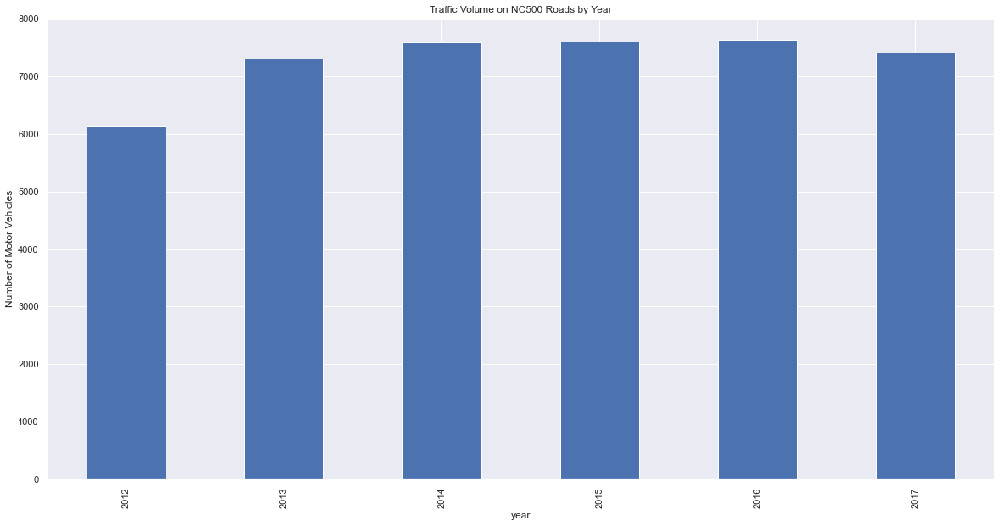

In [32]:
results = focus_points[['year','all_motor_vehicles']].groupby('year').sum()

ax = results.plot(kind="bar")
plt.title("Traffic Volume on NC500 Roads by Year")
plt.ylabel("Number of Motor Vehicles")
plt.legend().remove()

The results are quite surprising as there is barely any difference before and after 2015. After investigating further, the issue might be that most of the counts were done in the spring and the autumn, outside of the main tourist season of the summer. Additionally, these are minor roads, perhaps tourists tend stick to the main route.

#### References:

- Road count data: https://roadtraffic.dft.gov.uk/regions/3 <br/> Source: Department for Traffic, available under the Open Government Licence v3.0

- Local authority shape data: https://geoportal.statistics.gov.uk/datasets/local-authority-districts-december-2017-boundaries-gb-bsc <br/> Source: Office for National Statistics licensed under the Open Government Licence v.3.0

- UK road map shape data: https://roadtraffic.dft.gov.uk/downloads <br/> Source: Department for Traffic, available under the Open Government Licence v3.0

- ESPG codes and info: https://all-geo.org/volcan01010/2012/11/change-coordinates-with-pyproj/

- Folium guides https://python-visualization.github.io/folium/quickstart.html; https://www.kaggle.com/learn/geospatial-analysis

- Edinburgh City Bypass roads https://en.wikipedia.org/wiki/Edinburgh_City_Bypass

- Scottish border roads https://www.scotlandinfo.eu/england-scotland-border-carter-bar/

- NC500 stats https://www.bbc.co.uk/news/uk-scotland-highlands-islands-40326188